# Deep Learning: Ex.7 - **Object detection**

Submitted by: **Alex Kovalyov**



In [1]:
# TensorFlow and tf.keras
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import load_model

import tensorflow_hub as hub  # <---- https://tfhub.dev


# Helper libraries
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle  # <---- to draw rectangles 

---
### 1. Object detection

Let's pick one of the `Faster R-CNN` models from TF-Hub:
 https://tfhub.dev/tensorflow/faster_rcnn/inception_resnet_v2_640x640/1

As mentioned in this URL (check it), the model was trained on the **COCO 2017 dataset**. You will need the class labels of this dataset, which is provided in the 
`mscoco_label_map.pbtxt` file. Upload the file to your Colab notebook (drag-and-drop) and use the following code to extract the labels from it.


In [2]:
base_dir= "/content/drive/MyDrive/ex7/"

In [3]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [4]:
!ls "/content/drive/MyDrive/ex7"

bugs.jpg  dog.jpg  giraffe.jpg	kids.jpg  mscoco_label_map.pbtxt  person.jpg


In [5]:
def read_label_map(label_map_path):
    item_id = None
    item_name = None
    items = {}
    with open(label_map_path, "r") as file:
        for line in file:
            line.replace(" ", "")
            if line == "item{":
                pass
            elif line == "}":
                pass
            elif "id" in line:
                item_id = int(line.split(":", 1)[1].strip())
            elif "display_name" in line:
                item_name = line.split(":", 1)[1].replace("\"", "").strip()

            if item_id is not None and item_name is not None:
                items[item_id] = item_name
                item_id = None
                item_name = None
    return items

# load "mscoco" labels
labels =  read_label_map('/content/drive/MyDrive/ex7/mscoco_label_map.pbtxt')
labels

{1: 'person',
 2: 'bicycle',
 3: 'car',
 4: 'motorcycle',
 5: 'airplane',
 6: 'bus',
 7: 'train',
 8: 'truck',
 9: 'boat',
 10: 'traffic light',
 11: 'fire hydrant',
 13: 'stop sign',
 14: 'parking meter',
 15: 'bench',
 16: 'bird',
 17: 'cat',
 18: 'dog',
 19: 'horse',
 20: 'sheep',
 21: 'cow',
 22: 'elephant',
 23: 'bear',
 24: 'zebra',
 25: 'giraffe',
 27: 'backpack',
 28: 'umbrella',
 31: 'handbag',
 32: 'tie',
 33: 'suitcase',
 34: 'frisbee',
 35: 'skis',
 36: 'snowboard',
 37: 'sports ball',
 38: 'kite',
 39: 'baseball bat',
 40: 'baseball glove',
 41: 'skateboard',
 42: 'surfboard',
 43: 'tennis racket',
 44: 'bottle',
 46: 'wine glass',
 47: 'cup',
 48: 'fork',
 49: 'knife',
 50: 'spoon',
 51: 'bowl',
 52: 'banana',
 53: 'apple',
 54: 'sandwich',
 55: 'orange',
 56: 'broccoli',
 57: 'carrot',
 58: 'hot dog',
 59: 'pizza',
 60: 'donut',
 61: 'cake',
 62: 'chair',
 63: 'couch',
 64: 'potted plant',
 65: 'bed',
 67: 'dining table',
 70: 'toilet',
 72: 'tv',
 73: 'laptop',
 74: 'mo

- Load and run the trained model for each of the images given in this exercise.

- For each image, plot a graph of the detection scores.

- For each image, set a minimal score threshold, and plot the final image with the detected objects (marked with their class name and score).


In [6]:
    ################################
    ###  your code goes here...  ###
    ################################
module_handle = 'https://tfhub.dev/tensorflow/faster_rcnn/inception_resnet_v2_640x640/1'

detector = hub.load(module_handle)

(1800, 1232, 3)
(576, 768, 3)
(500, 500, 3)
(400, 600, 3)
(424, 640, 3)


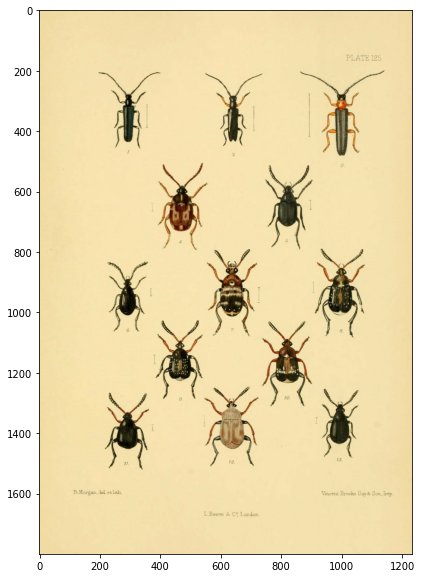

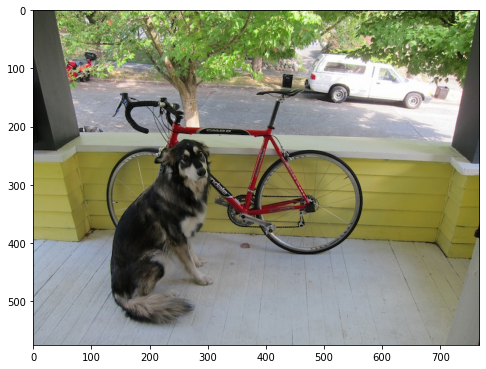

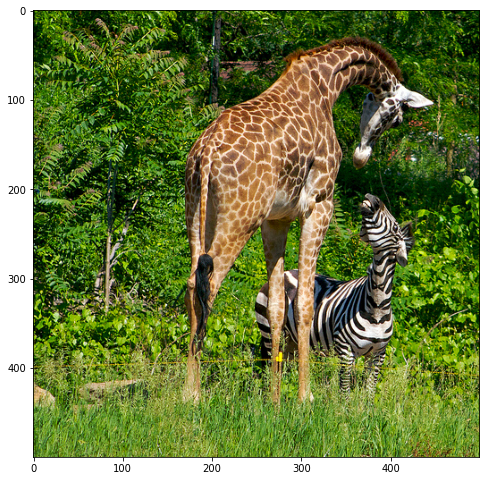

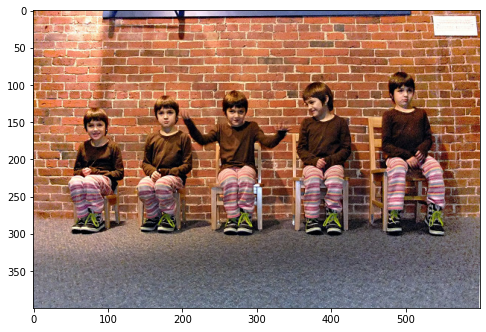

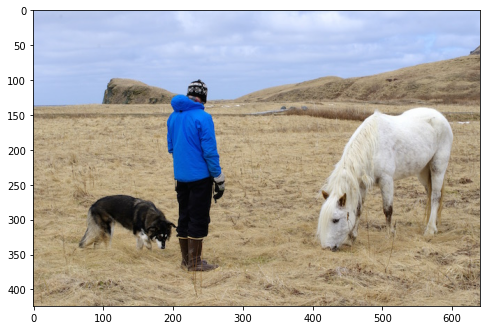

In [7]:
images=["bugs.jpg","dog.jpg","giraffe.jpg","kids.jpg","person.jpg"]
ts_images=[]
for img in images:
  img = tf.io.read_file(base_dir+img)
  img = tf.image.decode_jpeg(img, channels=3)
  print(img.shape)
  im = img.numpy()
  im_h, im_w, _ = im.shape

  plt.figure(figsize=(8,10))
  plt.imshow(im)
  converted_img  = tf.image.convert_image_dtype(img, tf.uint8)[tf.newaxis, ...]
  ts_images.append(converted_img)

detection_scores.shape =  (100,)
detection_scores.shape =  (100,)
detection_scores.shape =  (100,)
detection_scores.shape =  (100,)
detection_scores.shape =  (100,)


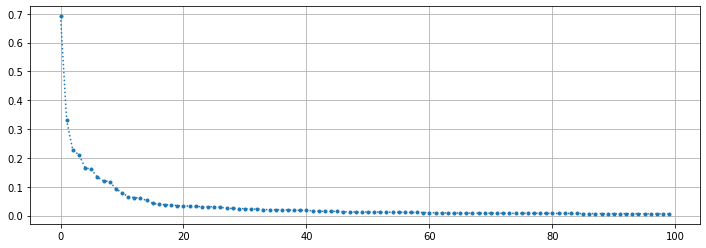

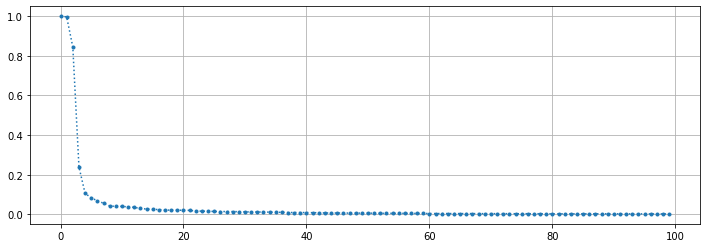

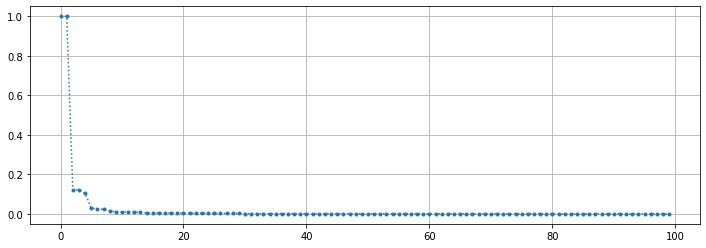

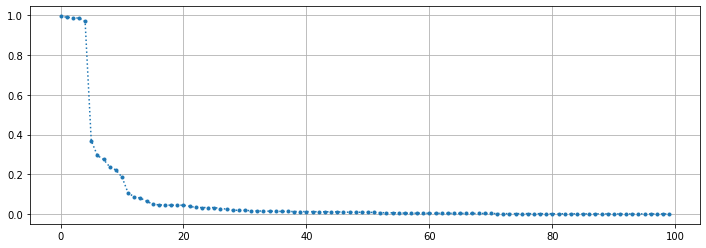

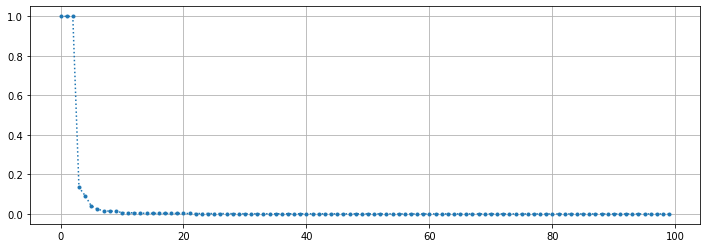

In [8]:
for converted_img in ts_images:
  result = detector(converted_img)
  detection_scores = result['detection_scores'].numpy()[0,:]

  print('detection_scores.shape = ',detection_scores.shape)
  plt.figure(figsize=(12,4))
  plt.plot(detection_scores,'.:')
  plt.grid() 



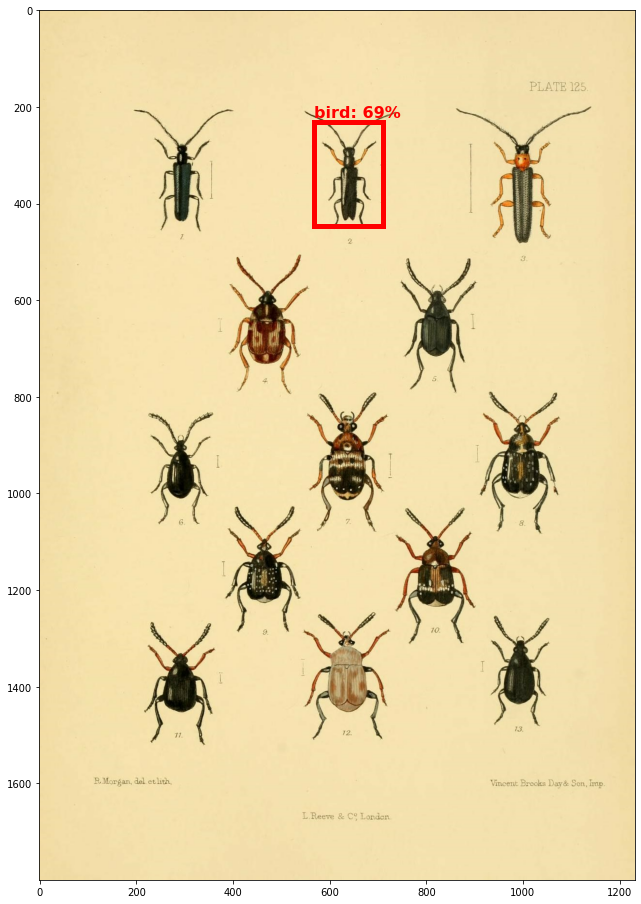

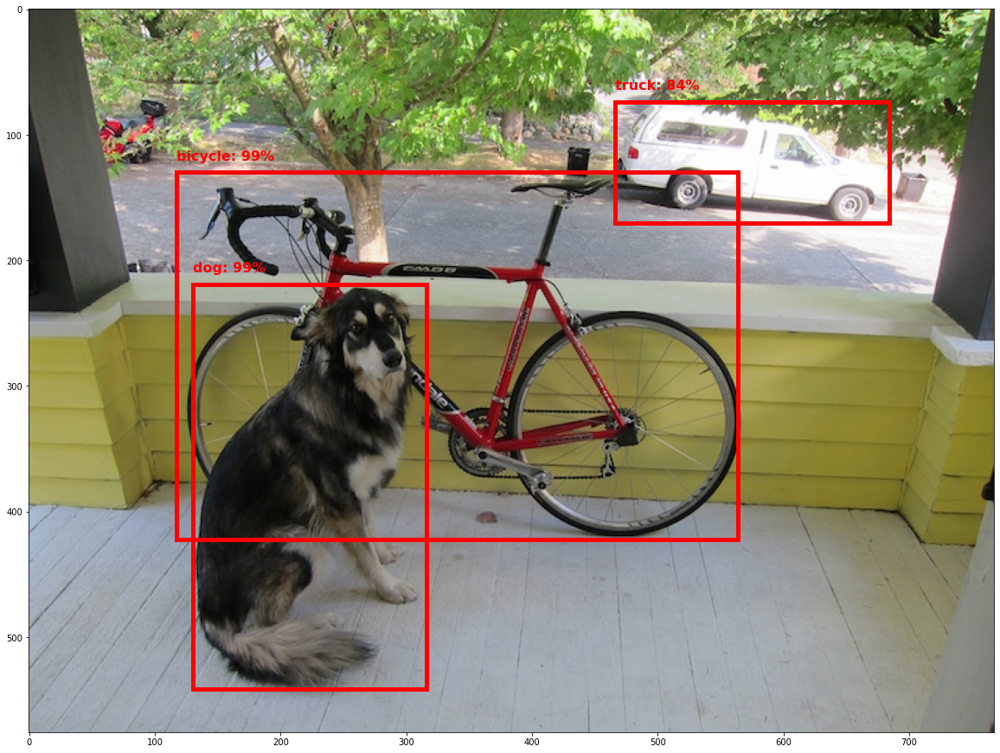

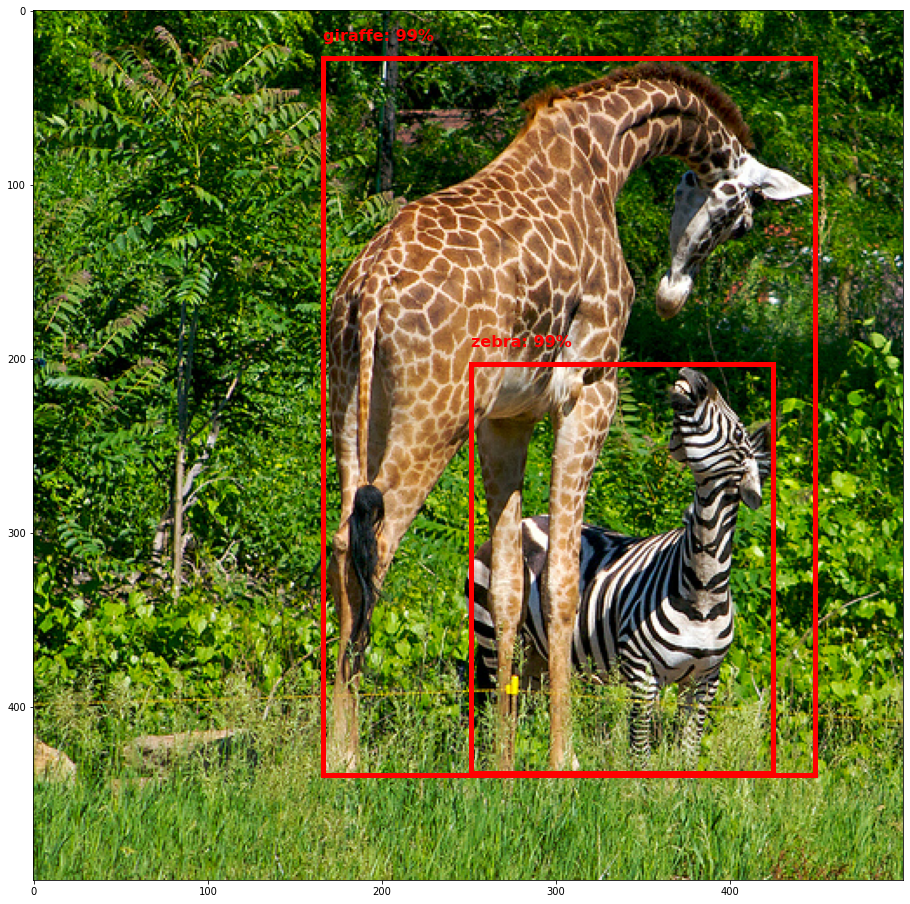

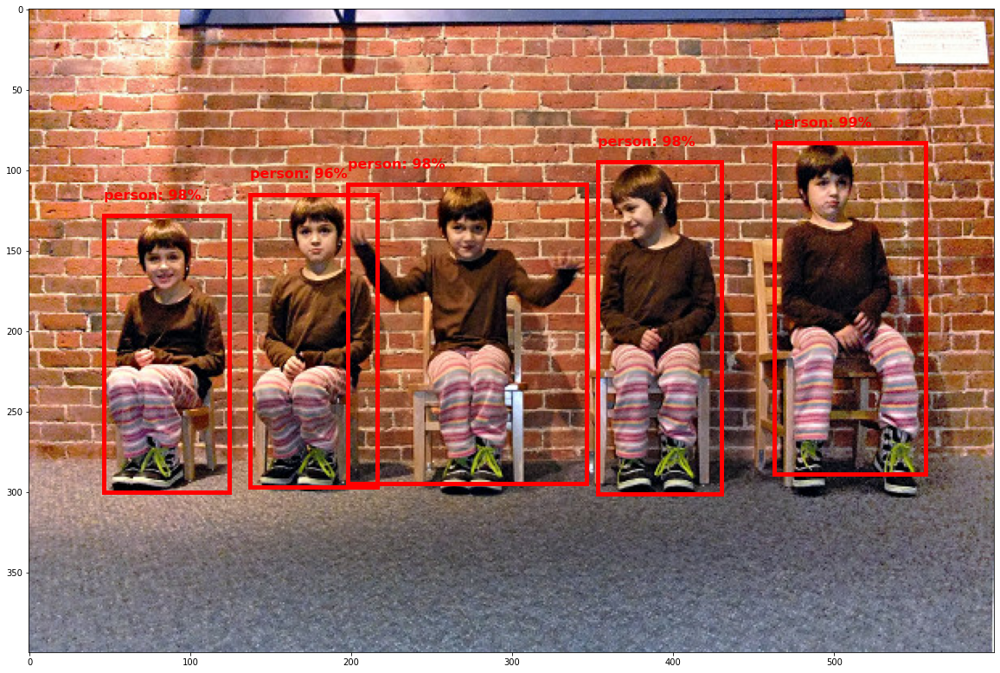

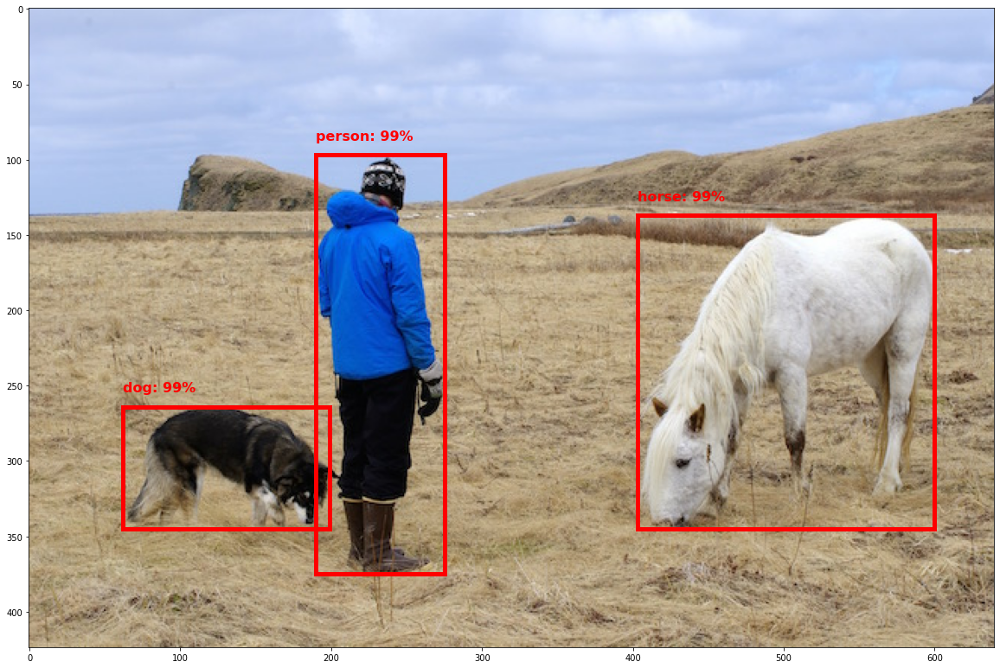

In [9]:
for img ,converted_img in zip(images, ts_images):
  THRESHOLD = 0.6
  absolute_coord = []
  result = detector(converted_img)
  detection_boxes = result['detection_boxes'].numpy()[0,...]
  detection_scores=result['detection_scores'].numpy()[0,...]
  N=len(detection_boxes)
  detection_boxes[:10,:]
  detection_classes = result['detection_classes'].numpy().astype(np.int)[0,:]
  detection_classes[:30]
  img = tf.io.read_file(base_dir+img)
  img = tf.image.decode_jpeg(img, channels=3)
  im = img.numpy()
  im_h, im_w, _ = im.shape

  

  plt.figure(figsize=(20,16))
  plt.imshow(img)
  for i in range(N):
    if detection_scores[i]<THRESHOLD:
      continue
    ymin, xmin, ymax, xmax = detection_boxes[i]

    box_x = int(xmin * im_w)
    box_y = int(ymin * im_h)
    box_w = int((xmax-xmin) * im_w)
    box_h = int((ymax-ymin) * im_h)
    absolute_coord.append((box_x,box_y,box_w,box_h))

    ax = plt.gca() # get current Axes

      # Add a Rectangle patch to the Axes
    ax.add_patch(Rectangle((box_x, box_y), box_w, box_h, linewidth=5, edgecolor='r', facecolor='none'))

    txt = "{}: {}%".format(labels[detection_classes[i]], 
                            int(100 * detection_scores[i]))

    ax.annotate(txt, xy=(box_x,box_y-10),color='r', fontsize=16, weight='bold')
  plt.show()



---
### 2. Let's try a different model

As noticed, the 'bugs' image was not labeled correctly, as there is  no 'beetle' class in the MS-COCO dataset.

Let's pick a different model:
https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1

This model was trained over the **OpenImagesV4 dataset** (1.7M images with 600 object classes).

- Run this model on the 'bugs' image, and display the results.

Note that you can get the detection class names, directly from the model (see the `example use` section in the model's URL).

In [10]:
    ################################
    ###  your code goes here...  ###
    ################################
module_handle = "https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1" 

detector = hub.load(module_handle).signatures['default']




INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


(1800, 1232, 3)
detection_scores.shape =  (100,)


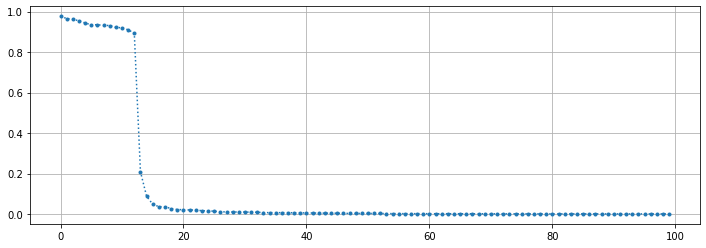

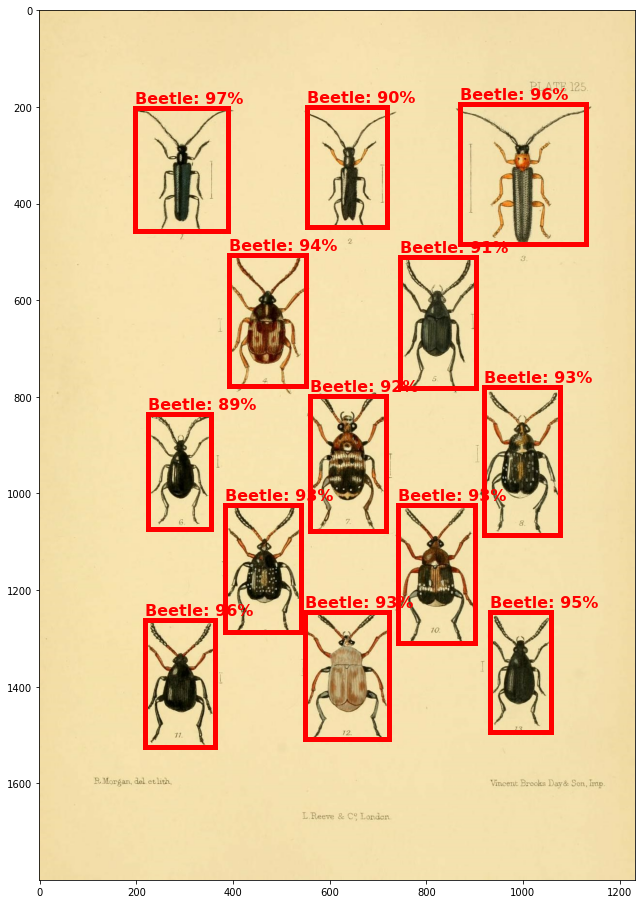

In [11]:
  img = tf.io.read_file(base_dir+"bugs.jpg")
  img = tf.image.decode_jpeg(img, channels=3)
  print(img.shape)
  im = img.numpy()
  im_h, im_w, _ = im.shape

  THRESHOLD = 0.6

  converted_img  = tf.image.convert_image_dtype(img, tf.float32)[tf.newaxis, ...]
  result = detector(converted_img)
  result = {key:value.numpy() for key,value in result.items()}

  detection_scores = result['detection_scores']
  detection_class_names=result["detection_class_names"]
  detection_class_entities=result["detection_class_entities"]
  detection_boxes = result['detection_boxes']
  N=len(detection_boxes)

  print('detection_scores.shape = ',detection_scores.shape)

  plt.figure(figsize=(12,4))
  plt.plot(detection_scores,'.:')
  plt.grid() 

  plt.figure(figsize=(20,16))
  plt.imshow(img)
  for i in range(N):
   
    if detection_scores[i]<THRESHOLD:
      continue
    ymin, xmin, ymax, xmax = detection_boxes[i]

    box_x = int(xmin * im_w)
    box_y = int(ymin * im_h)
    box_w = int((xmax-xmin) * im_w)
    box_h = int((ymax-ymin) * im_h)
    absolute_coord.append((box_x,box_y,box_w,box_h))

    ax = plt.gca() # get current Axes

      # Add a Rectangle patch to the Axes
    ax.add_patch(Rectangle((box_x, box_y), box_w, box_h, linewidth=5, edgecolor='r', facecolor='none'))

    txt = "{}: {}%".format( detection_class_entities[i].decode("ascii"),int(100 * detection_scores[i]))

    ax.annotate(txt, xy=(box_x,box_y-10),color='r', fontsize=16, weight='bold')
  plt.show()

---
### 3. Keypoints detection

Some of the models, trained on the **MS-COCO datasets**, include not only the bounding boxes of the objects, but also a set of **17 keypoints** for each of the persons detected in the image (e.g., elbows, head, knees, hands, etc...).

Pick one such model, e.g:
https://tfhub.dev/tensorflow/centernet/resnet50v2_512x512_kpts/1

As noted in the URL, these 17 keypoints are returned as:

`detection_keypoints: a tf.float32 tensor of shape [1, N, 17, 2] containing the detected keypoints.`

- For each person detected in the image, plot its 17 keypoints. In addition, draw the "skeleton" for each person, by connecting the lines between the keypoints. Use the provided mapping: `COCO17_HUMAN_POSE_KEYPOINTS`. For example: `COCO17_HUMAN_POSE_KEYPOINTS[0] = (0,1)` means that you need to draw a line between keypoint 0 to keypoint 1. See lecture slides for details.

- Run the model and display the results, for all the images containing any persons.


In [12]:
COCO17_HUMAN_POSE_KEYPOINTS = [(0, 1),
 (0, 2),
 (1, 3),
 (2, 4),
 (0, 5),
 (0, 6),
 (5, 7),
 (7, 9),
 (6, 8),
 (8, 10),
 (5, 6),
 (5, 11),
 (6, 12),
 (11, 12),
 (11, 13),
 (13, 15),
 (12, 14),
 (14, 16)]

In [13]:
module_handle = 'https://tfhub.dev/tensorflow/centernet/resnet50v2_512x512_kpts/1'

detector = hub.load(module_handle)

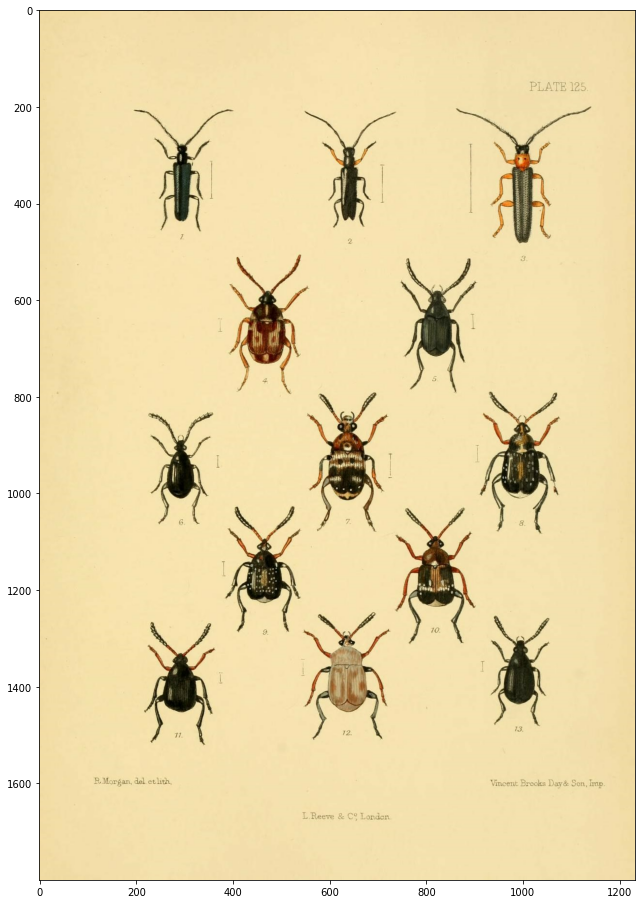

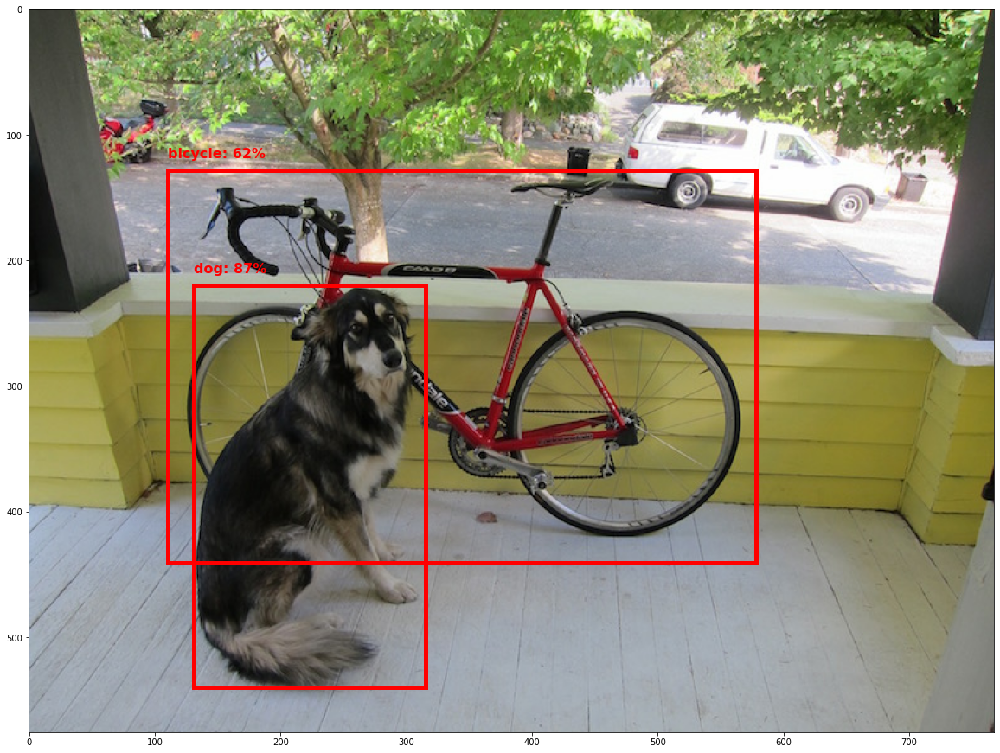

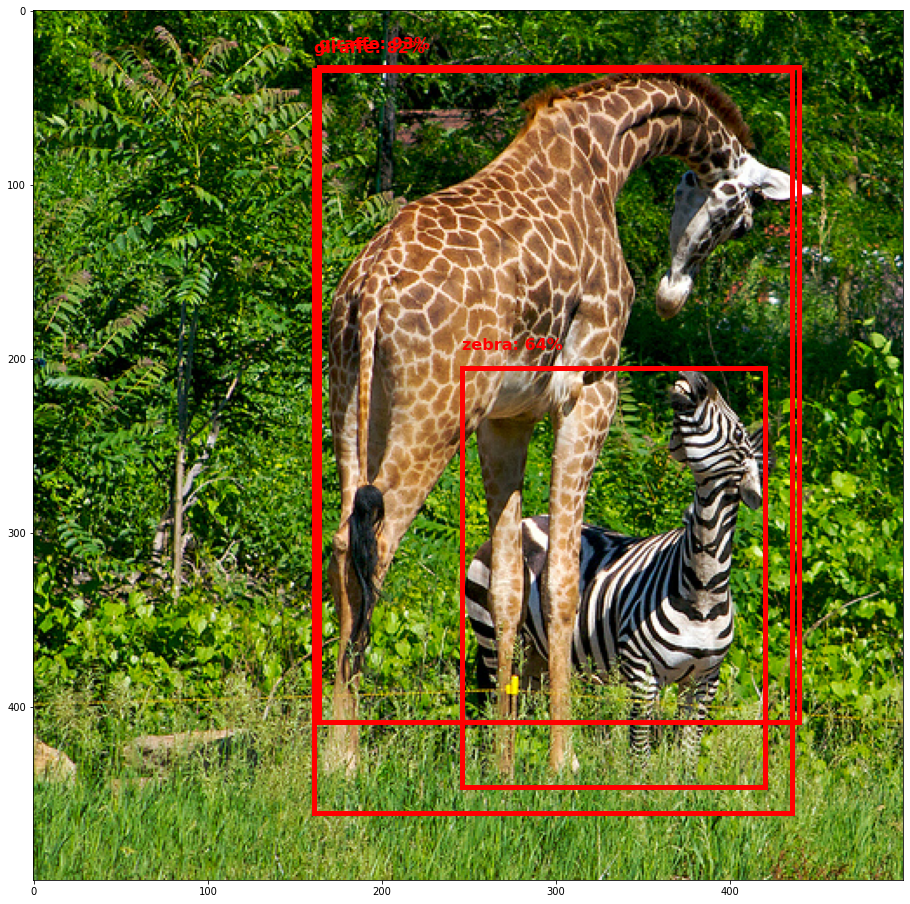

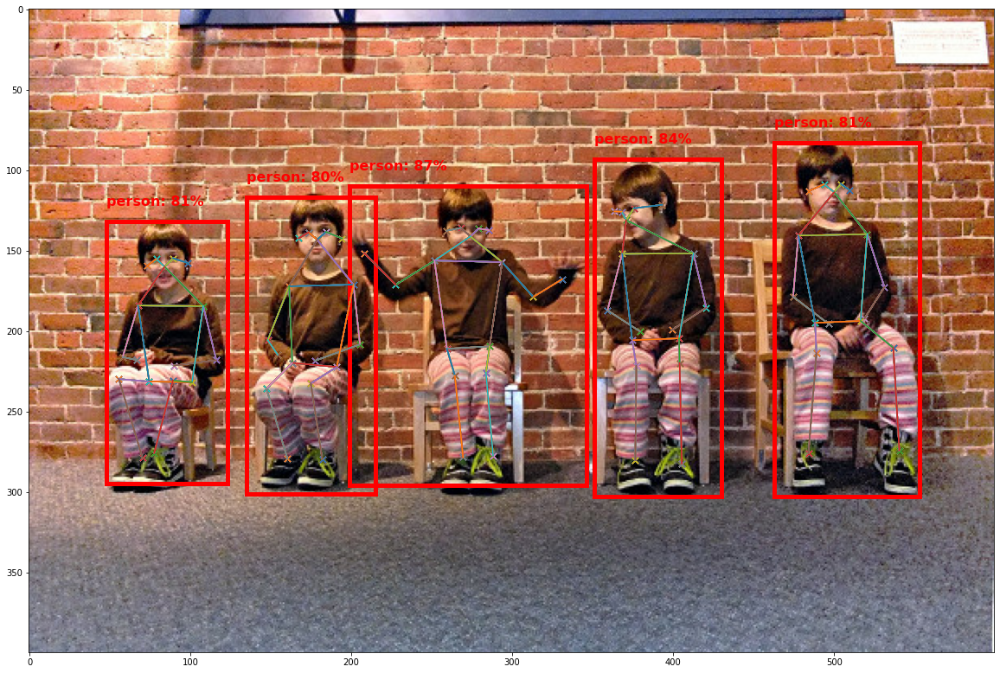

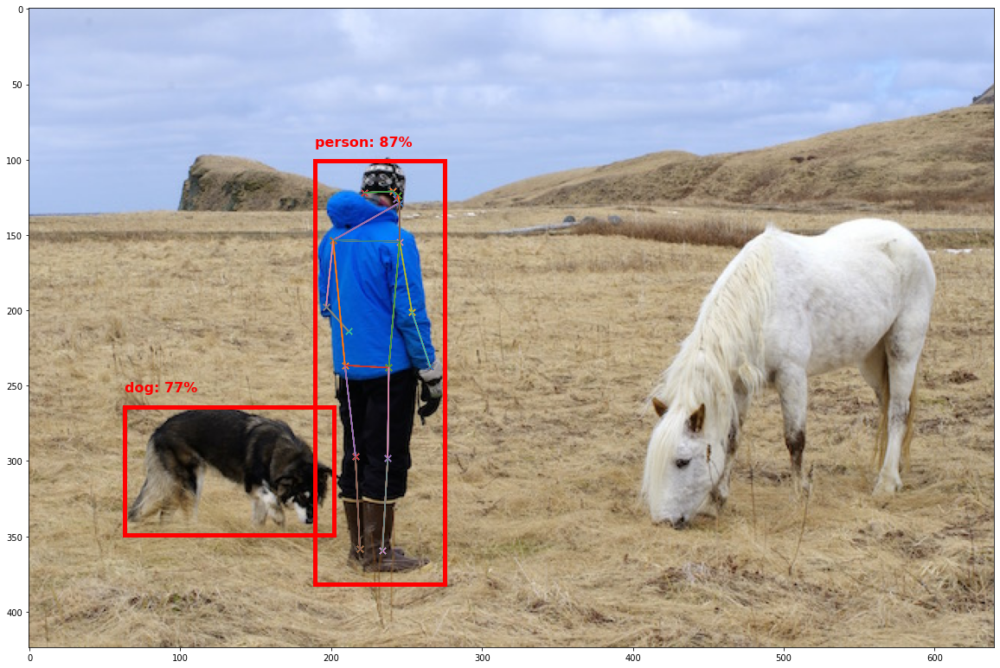

In [14]:
for img ,converted_img in zip(images, ts_images):
  THRESHOLD = 0.6
  absolute_coord = []
  result = detector(converted_img)
  detection_boxes = result['detection_boxes'].numpy()[0,...]
  detection_scores=result['detection_scores'].numpy()[0,...]
  N=len(detection_boxes)
  detection_boxes[:10,:]
  detection_classes = result['detection_classes'].numpy().astype(np.int)[0,:]
  detection_keypoints=result['detection_keypoints'].numpy()[0,...]
  detection_keypoint_scores=result['detection_keypoint_scores'].numpy()[0,...]
  detection_classes[:30]
  img = tf.io.read_file(base_dir+img)
  img = tf.image.decode_jpeg(img, channels=3)
  im = img.numpy()
  im_h, im_w, _ = im.shape

  

  plt.figure(figsize=(20,16))
  plt.imshow(img)
  for i in range(N):
    if detection_scores[i]<THRESHOLD:
      continue
    ymin, xmin, ymax, xmax = detection_boxes[i]

    box_x = int(xmin * im_w)
    box_y = int(ymin * im_h)
    box_w = int((xmax-xmin) * im_w)
    box_h = int((ymax-ymin) * im_h)
    konnection_points=detection_keypoints[i]
    ax = plt.gca()

    ax.add_patch(Rectangle((box_x, box_y), box_w, box_h, linewidth=5, edgecolor='r', facecolor='none'))

    txt = "{}: {}%".format(labels[detection_classes[i]], 
                              int(100 * detection_scores[i]))

    ax.annotate(txt, xy=(box_x,box_y-10),color='r', fontsize=16, weight='bold')

    for detection_keypoint_score in detection_keypoint_scores[i]:
      if (detection_keypoint_score < THRESHOLD).all():
        continue

      x_pos=[]
      y_pos=[]

      for x,y in konnection_points:
        ax.scatter(y*im_w, x*im_h, marker="x", s=50, linewidths=5 )
        y_pos.append(y*im_w)
        x_pos.append(x*im_h)

      for p1,p2 in  COCO17_HUMAN_POSE_KEYPOINTS:
        ax.plot([y_pos[p1],y_pos[p2]],[x_pos[p1],x_pos[p2]])
   

  plt.show()



***
## Good Luck!